In [1]:
import psf_interp
from psf_interp import *
import numpy as np
import matplotlib.pyplot as plt
from importlib import reload

In [29]:
reload(psf_interp)
import  psf_interp
from psf_interp import *

In [3]:
import astropy
from astropy.io import fits


fname = "/home/masha/Downloads/AnisoCADO_SCAO_FVPSF_4mas_EsoMedian_20190328.fits"
hdul = fits.open(fname)

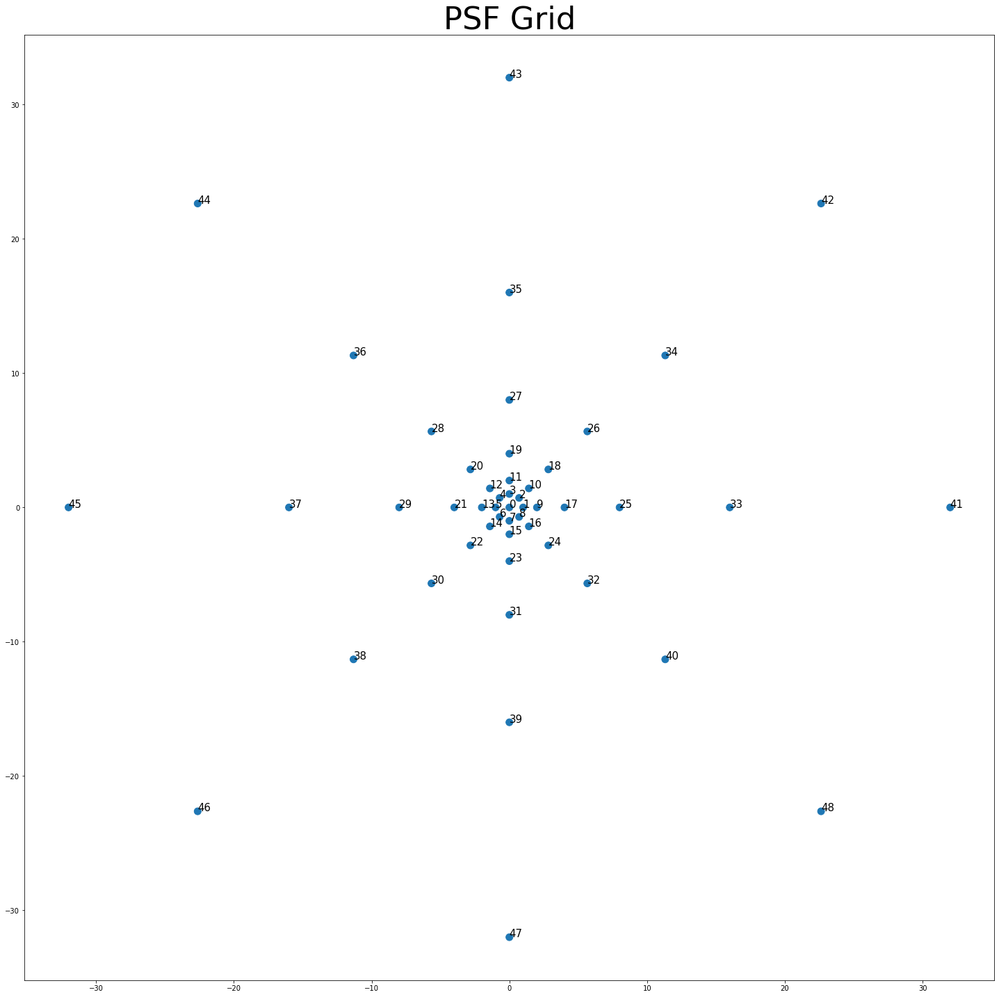

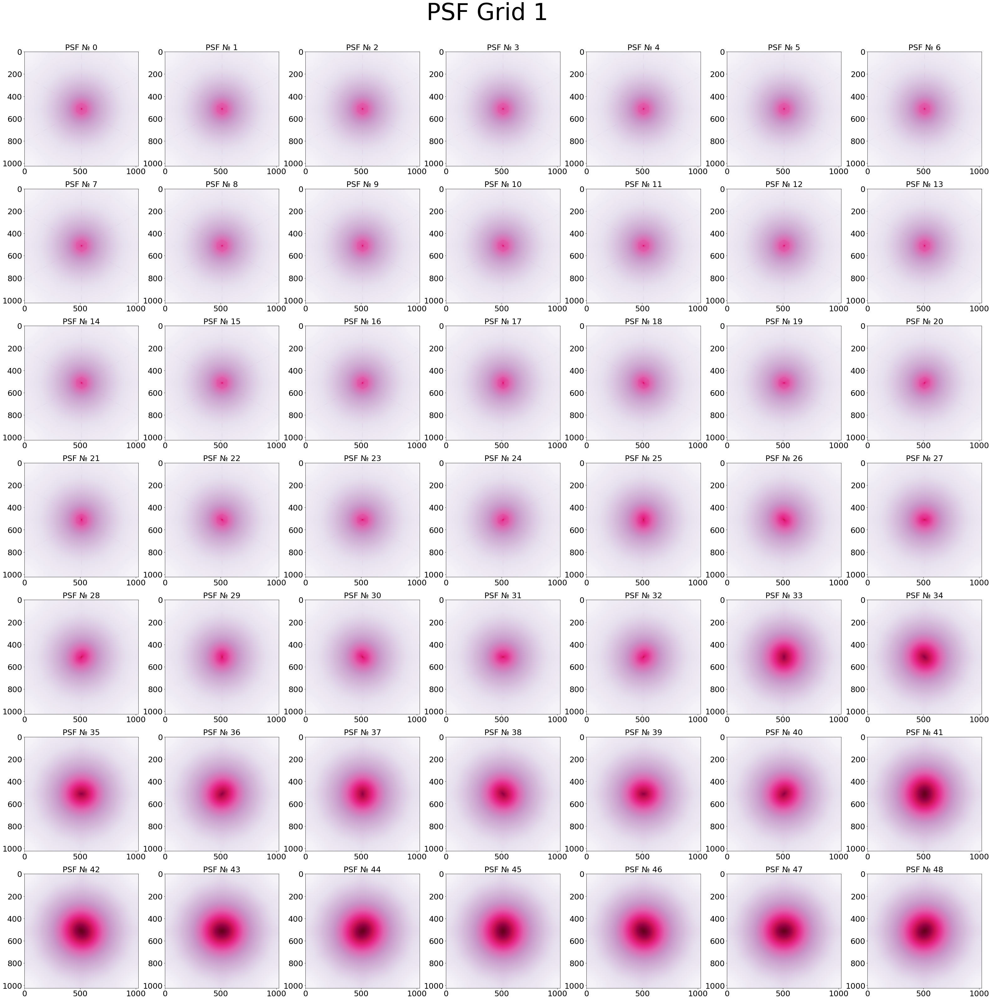

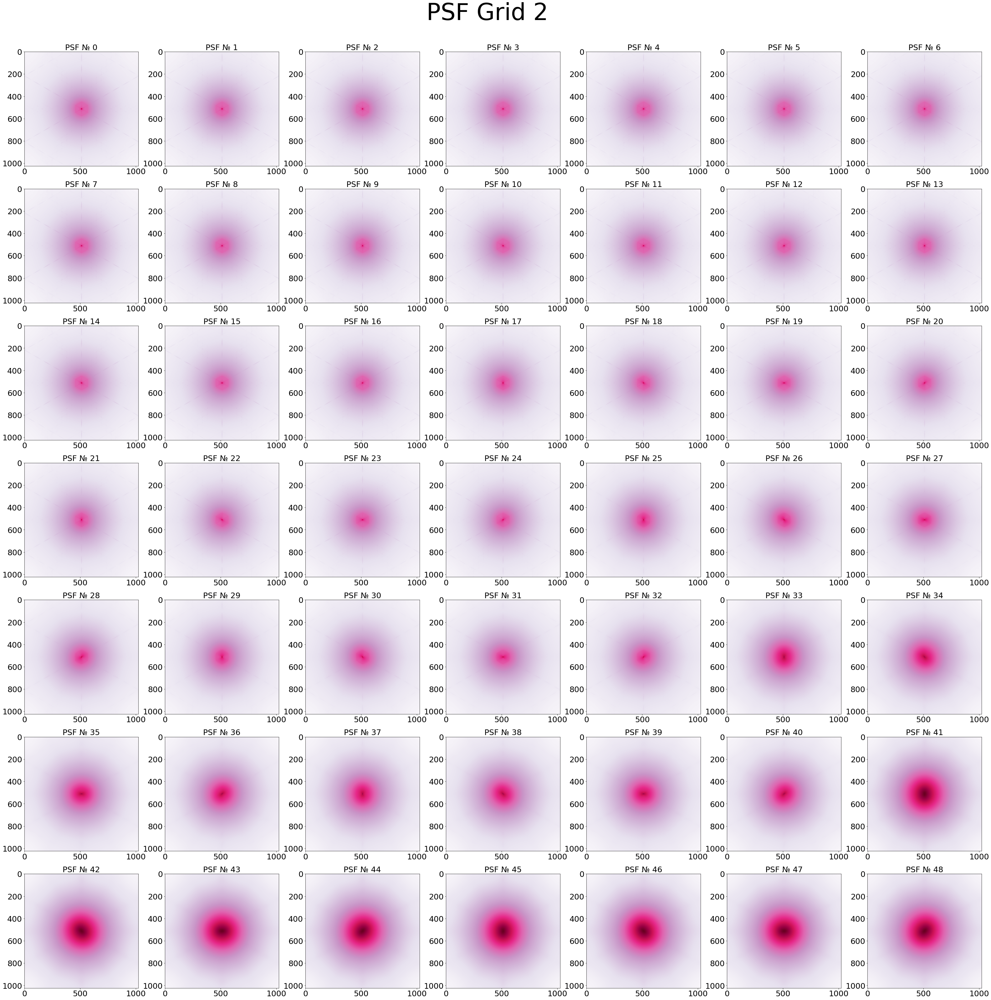

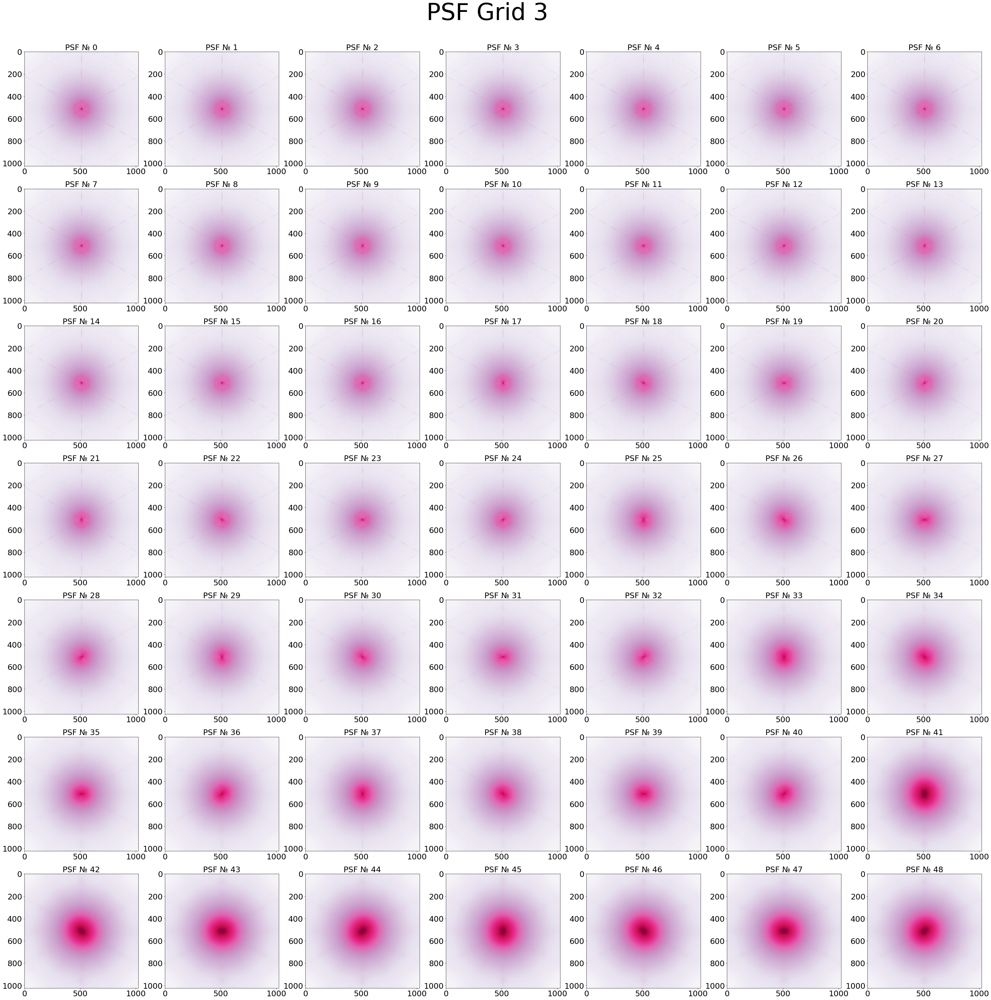

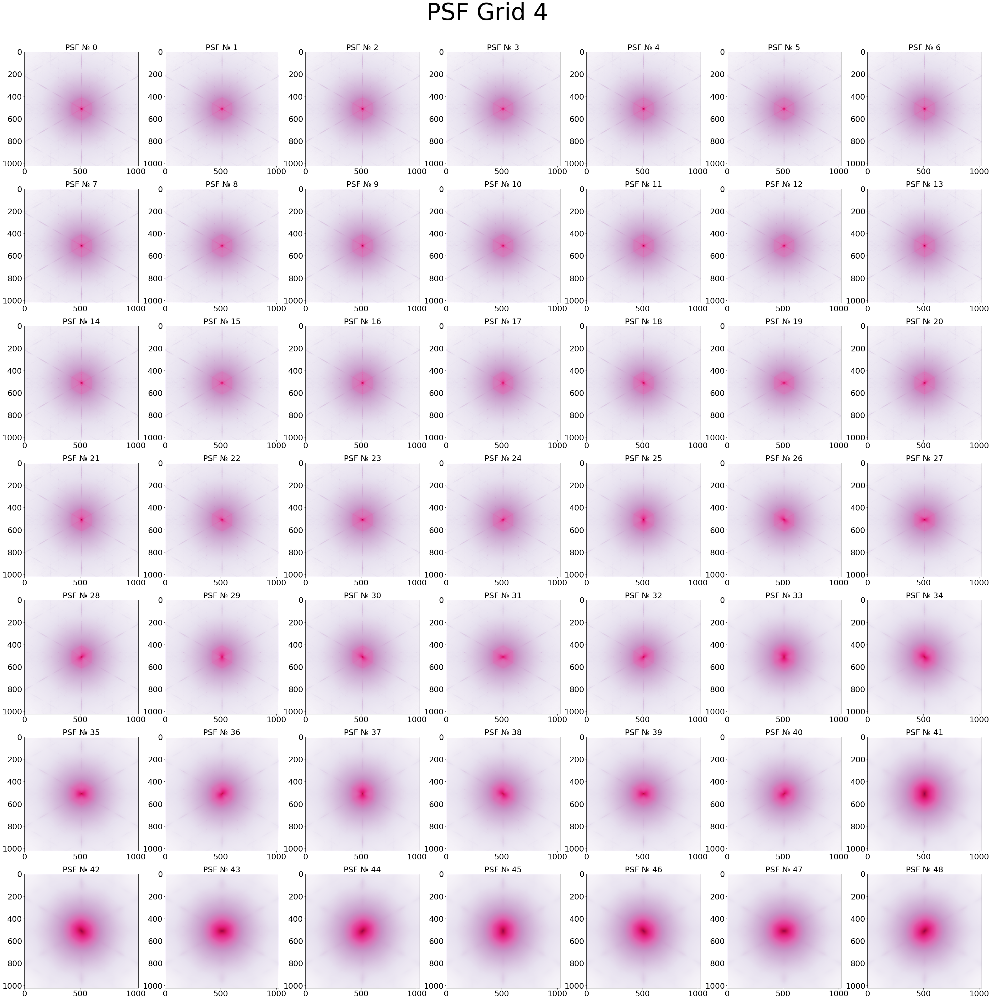

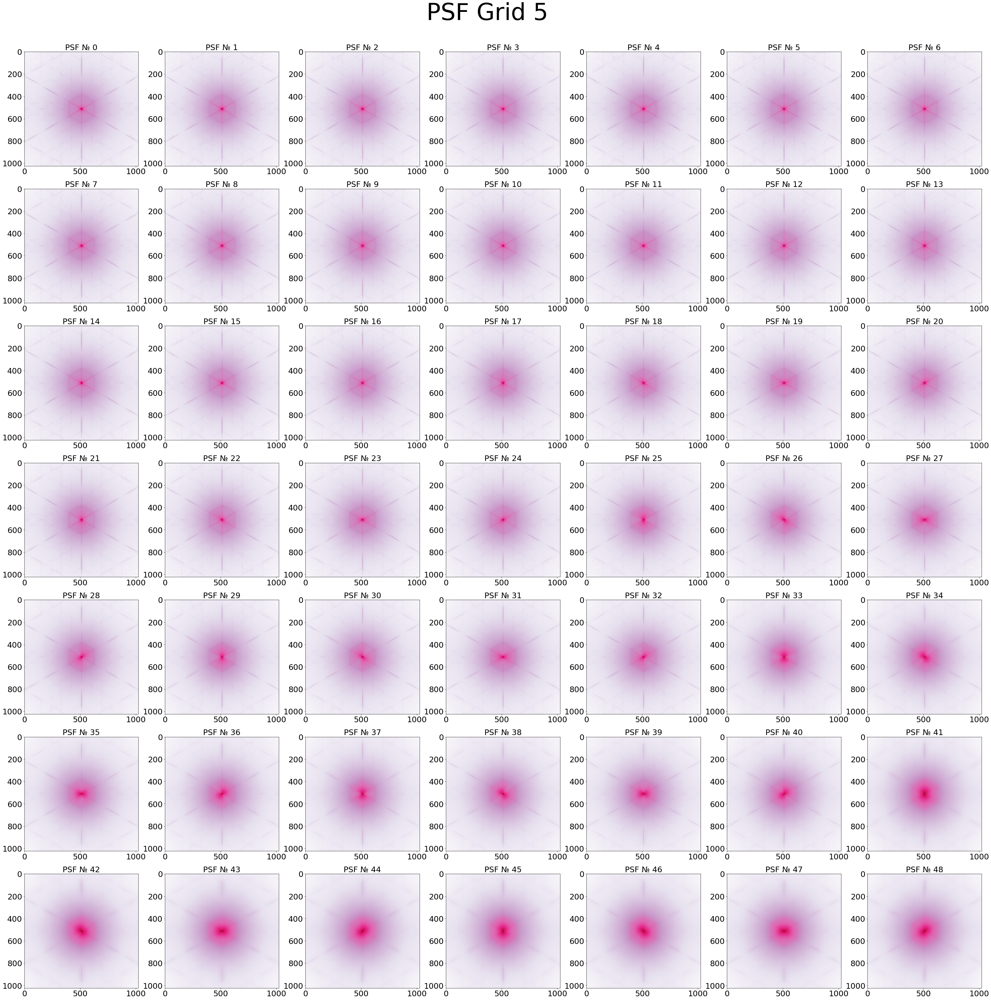

In [14]:
plot_psfs(hdul, save=False)

In [4]:
from astropy.table import Table

psf_grid_table = Table.read(fname, format='fits')

49 49
[0.33579952 0.15911332 0.04738673 0.27815599 0.67969027 0.6236004
 0.11019347 0.54824893 0.4951483  0.68003237 0.48363067 0.36629124
 0.1041223  0.32422158 0.3695631  0.08435721 0.24547077 0.35353423
 0.77266199 0.71229892 0.47091043 0.95085319 0.79049642 0.31919416
 0.18199907 0.73726644 0.81125897 0.16808638 0.07386831 0.52500762
 0.55060301 0.25326103 0.51675513 0.77666998 0.51560347 0.63407396
 0.77122753 0.19850222 0.24729824 0.90632663 0.17841859 0.22962494
 0.35449695 0.49694117 0.72424311 0.6241766  0.60386475 0.53618595
 0.66906375]


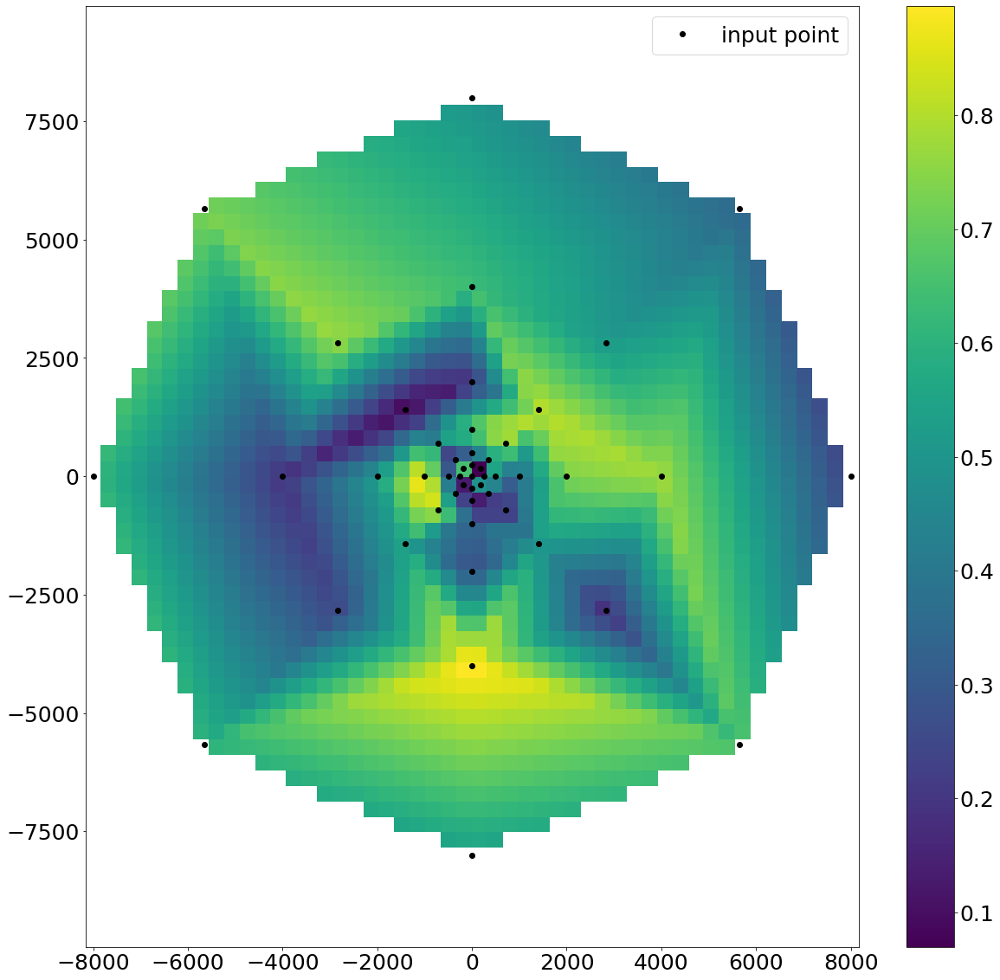

[[-8000.         -7673.46938776 -7346.93877551 ...  7346.93877551
   7673.46938776  8000.        ]
 [-8000.         -7673.46938776 -7346.93877551 ...  7346.93877551
   7673.46938776  8000.        ]
 [-8000.         -7673.46938776 -7346.93877551 ...  7346.93877551
   7673.46938776  8000.        ]
 ...
 [-8000.         -7673.46938776 -7346.93877551 ...  7346.93877551
   7673.46938776  8000.        ]
 [-8000.         -7673.46938776 -7346.93877551 ...  7346.93877551
   7673.46938776  8000.        ]
 [-8000.         -7673.46938776 -7346.93877551 ...  7346.93877551
   7673.46938776  8000.        ]] [[-8000.         -8000.         -8000.         ... -8000.
  -8000.         -8000.        ]
 [-7673.46938776 -7673.46938776 -7673.46938776 ... -7673.46938776
  -7673.46938776 -7673.46938776]
 [-7346.93877551 -7346.93877551 -7346.93877551 ... -7346.93877551
  -7346.93877551 -7346.93877551]
 ...
 [ 7346.93877551  7346.93877551  7346.93877551 ...  7346.93877551
   7346.93877551  7346.93877551]
 [ 7673

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

In [6]:
x_psfs = psf_grid_table['x'].data/0.004
y_psfs = psf_grid_table['y'].data/0.004
psfs_centres = [(x,y) for x, y in zip(x_psfs, y_psfs)]
z = np.random.rand(49)
print(len(z), len(psf_grid_table['x'].data))
x_min = x_psfs.min()
x_max = x_psfs.max()
y_min = y_psfs.min()
y_max = y_psfs.max()
interp_weights(psfs_centres, z, x_min, x_max, y_min, y_max)

In [8]:
psfs_centres

[(0.0, 0.0),
 (250.0, 0.0),
 (176.7766952966369, 176.7766952966369),
 (1.5308084989341916e-14, 250.0),
 (-176.77669529663686, 176.7766952966369),
 (-250.0, 3.061616997868383e-14),
 (-176.77669529663692, -176.77669529663686),
 (-4.5924254968025744e-14, -250.0),
 (176.77669529663683, -176.77669529663692),
 (500.0, 0.0),
 (353.5533905932738, 353.5533905932738),
 (3.061616997868383e-14, 500.0),
 (-353.5533905932737, 353.5533905932738),
 (-500.0, 6.123233995736766e-14),
 (-353.55339059327383, -353.5533905932737),
 (-9.184850993605149e-14, -500.0),
 (353.55339059327366, -353.55339059327383),
 (1000.0, 0.0),
 (707.1067811865476, 707.1067811865476),
 (6.123233995736766e-14, 1000.0),
 (-707.1067811865474, 707.1067811865476),
 (-1000.0, 1.2246467991473532e-13),
 (-707.1067811865477, -707.1067811865474),
 (-1.8369701987210297e-13, -1000.0),
 (707.1067811865473, -707.1067811865477),
 (2000.0, 0.0),
 (1414.213562373095, 1414.213562373095),
 (1.2246467991473532e-13, 2000.0),
 (-1414.2135623730949, 1

In [5]:
x_cl, y_cl, image_cl = generate_cluster(1.45, 2.46, pix_scale = 0.1) #microm wavelenght

In [16]:
image_cl.min(), image_cl.max()

(0.0, 1212410.6342105074)

In [6]:
x_psfs  = psf_grid_table['x'].data/0.004# - np.min(psf_grid_table['x'].data/0.004)
y_psfs = psf_grid_table['y'].data/0.004# - np.min(psf_grid_table['y'].data/0.004)


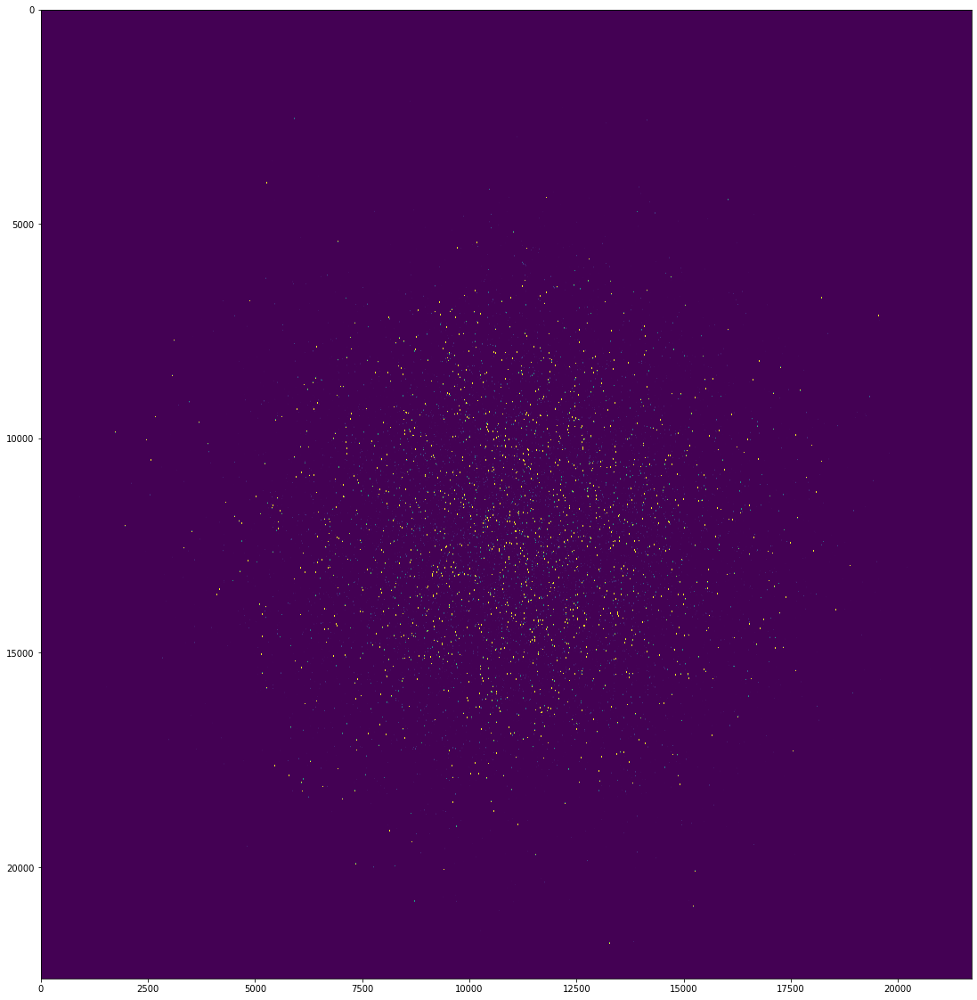

In [8]:
plt.figure(figsize=(20, 20))

plt.imshow(image_cl, vmin=0, vmax=1)

In [7]:
padded_to_equal = pad_image_to_box(image_cl, 3)

In [9]:
image_cl.min()

0.0

In [10]:
image_cl.max()

1212410.6342105074

In [11]:
image_cl.shape

(22596, 22596)

In [17]:
x_shifted = x_psfs + image_cl.shape[0]//2

In [18]:
y_shifted = y_psfs + image_cl.shape[1]//2

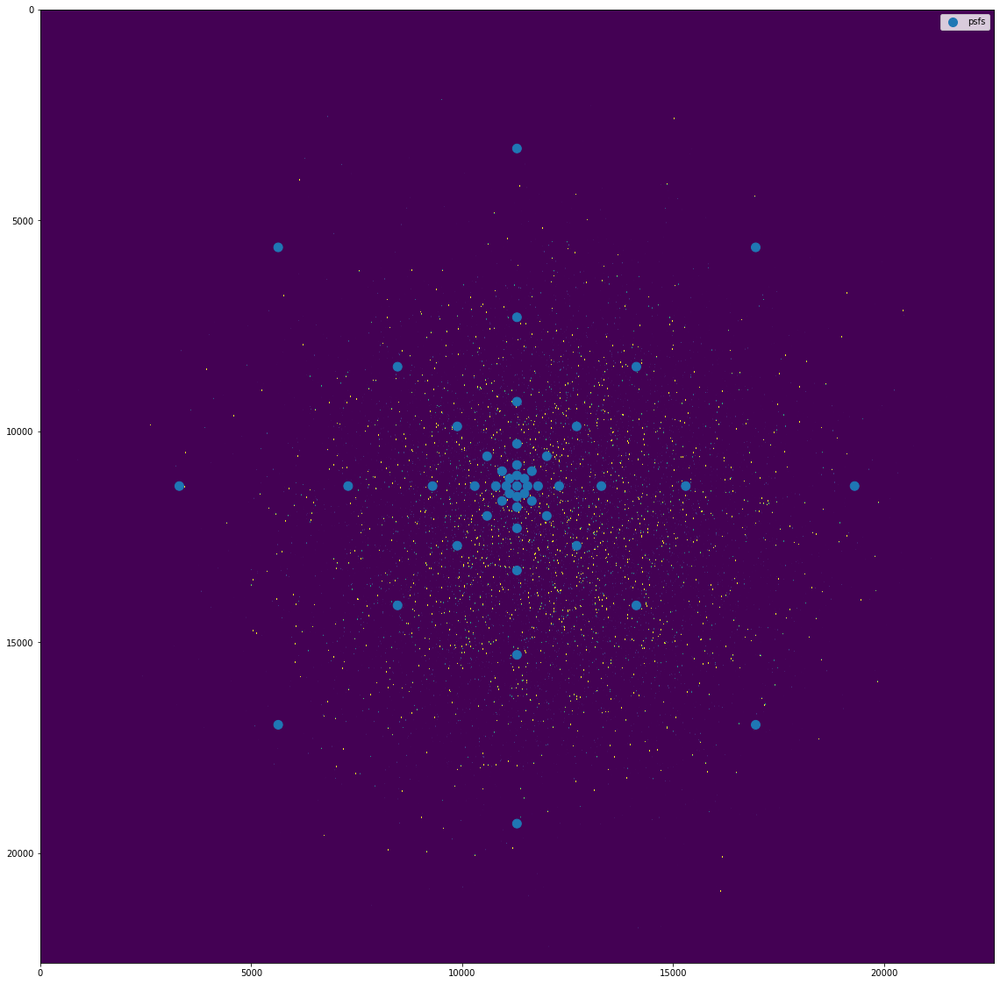

In [15]:
plt.figure(figsize=(20, 20))
#plt.scatter(x_cl, y_cl, 100*np.ones(len(y_cl)),label='stars')
plt.imshow(image_cl, vmin=0.0, vmax=1.0)
plt.scatter(x_shifted, y_shifted, 100*np.ones(len(x_psfs)),label='psfs')
plt.legend()
plt.show()